# Most frequency motif

In [55]:
from Bio import SeqIO
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

In [56]:
# Path to your FASTA file
fasta_file = '../haplo-utr3-oligo-pool.fa'

# List to store subsequences
subsequences = []

# Parse the FASTA file
for record in SeqIO.parse(fasta_file, "fasta"):
    # Ensure the sequence is long enough and extract the subsequence
    if len(record.seq) >= 285:
        subsequences.append(str(record.seq[15:285]))  # 0-based index, slice from 16 to 285


In [57]:
# Find and Count All 6-nt Motifs
motif_counts = Counter()
for seq in subsequences:
    for i in range(len(seq) - 5):  # Sliding window to get all 6-nt motifs
        motif = seq[i:i+6]
        motif_counts[motif] += 1

In [58]:

# Get the 10 most common motifs
most_common_motifs = motif_counts.most_common(20)

# Calculate the total number of 5-nt motifs counted
total_motifs = sum(motif_counts.values())

# Calculate percentages
motifs_percentages = [(motif, count / total_motifs * 100) for motif, count in most_common_motifs]

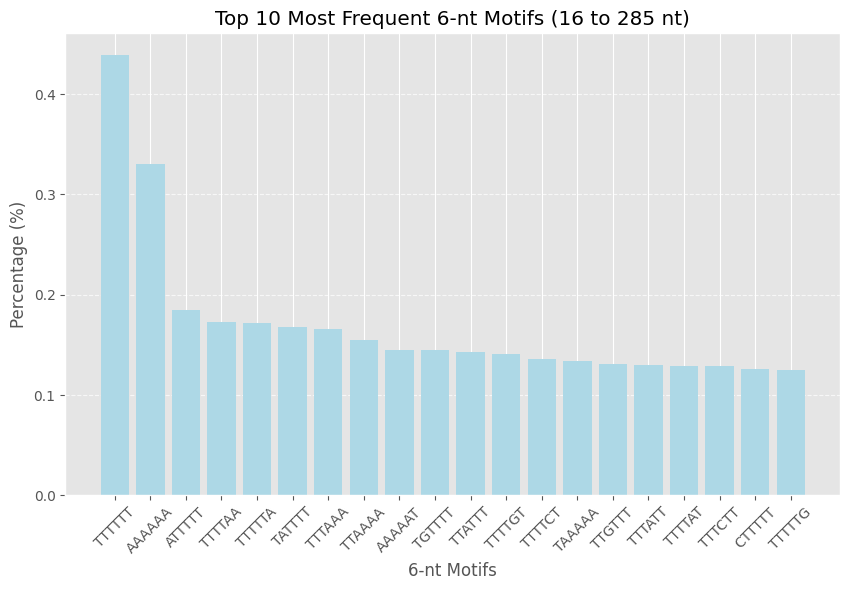

In [59]:
# Unpack motifs and their percentages for plotting
motifs, percentages = zip(*motifs_percentages)

plt.figure(figsize=(10, 6))
plt.bar(motifs, percentages, color='lightblue')
plt.xlabel('6-nt Motifs')
plt.ylabel('Percentage (%)')
plt.title('Top 10 Most Frequent 6-nt Motifs (16 to 285 nt)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Another method to count -Using numpy for Efficient Sliding Window Operations

In [60]:
import numpy as np
from Bio import SeqIO
from collections import Counter

fasta_file = '/home/yg2895/media/scratch/yang/haploinsufficiency/haplo-utr3-oligo-pool.fa'

def count_motifs_numpy(sequences, motif_length=6):
    # Prepare for counting motifs
    counter = Counter()
    
    # Convert sequences to numpy array for vectorized operations
    for seq in sequences:
        arr = np.array(list(seq))
        # Generate all motifs using a sliding window approach with numpy
        for i in range(len(seq) - motif_length + 1):
            motif = ''.join(arr[i:i+motif_length])
            counter[motif] += 1
    return counter

# Read and extract subsequences from the FASTA file
subsequences = []
for record in SeqIO.parse(fasta_file, "fasta"):
    if len(record.seq) >= 285:  # Ensure the sequence is long enough
        subsequences.append(str(record.seq[15:285]))

# Count motifs using numpy
motif_counts = count_motifs_numpy(subsequences)

# Proceed with finding most common motifs and plotting as described previously

KeyboardInterrupt: 

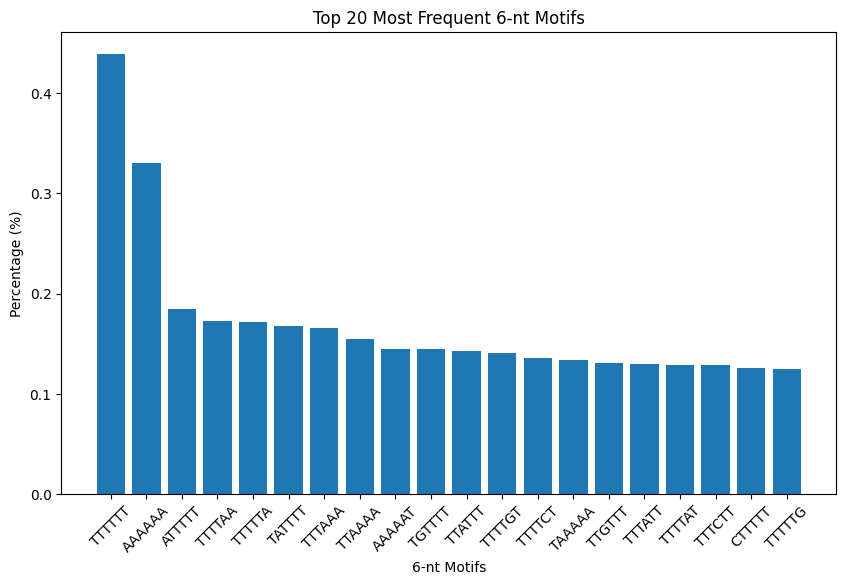

In [7]:
import matplotlib.pyplot as plt
from collections import Counter

# Get the 10 most common motifs
most_common_motifs = motif_counts.most_common(20)

# Calculate the total number of 5-nt motifs counted
total_motifs = sum(motif_counts.values())

# Calculate percentages
motifs_percentages = [(motif, count / total_motifs * 100) for motif, count in most_common_motifs]

motifs, percentages = zip(*motifs_percentages)

plt.figure(figsize=(10, 6))
plt.bar(motifs, percentages)
plt.xlabel('6-nt Motifs')
plt.ylabel('Percentage (%)')
plt.title('Top 20 Most Frequent 6-nt Motifs')
plt.xticks(rotation=45)
plt.show()


# AU rich elements (AREs) - AUUUA motif

In [6]:
from Bio import SeqIO
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [7]:
# Load sequences from a FASTA file
file_path = '../haplo-utr3-oligo-pool.fa'
sequences = [str(record.seq[15:285]) for record in SeqIO.parse(file_path, 'fasta')]  # Adjust index for 0-based

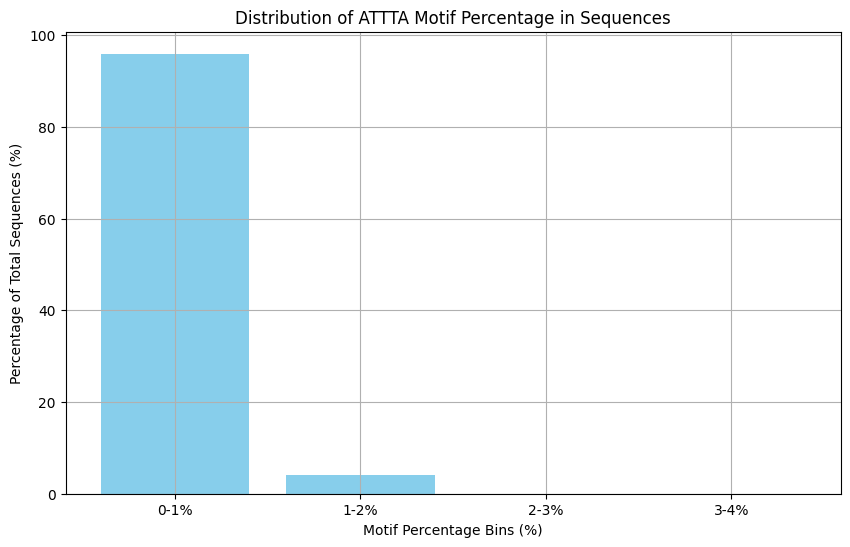

In [8]:
# Assuming 'sequences' is a list of DNA sequences and is defined earlier
motif = 'ATTTA'
motif_counts = [seq.count(motif) for seq in sequences]
total_lengths = [len(seq) for seq in sequences]  # Should be 270 for all, if not check sequence length
motif_percentages = [count / length * 100 if length > 0 else 0 for count, length in zip(motif_counts, total_lengths)]

# Create a DataFrame from motif percentages
percentages_df = pd.DataFrame(motif_percentages, columns=['Motif Percentage'])

# Define bin edges from 0% to 4% in four equal intervals
bin_edges = [0, 1, 2, 3, 4]

# Bin the percentage values into four bins
percentages_df['Binned Percentages'] = pd.cut(percentages_df['Motif Percentage'], bins=bin_edges, right=False)

# Calculate the counts for each bin
bin_counts = percentages_df['Binned Percentages'].value_counts().sort_index()

# Calculate the percentage of the total for each bin
total_sequences = len(sequences)
bin_percentages = (bin_counts / total_sequences) * 100

# Plotting the vertical bar plot with percentages on y-axis
plt.figure(figsize=(10, 6))
bar_width = 0.8  # Fixed bar width
plt.bar(bin_edges[:-1], bin_percentages.values, color='skyblue', width=bar_width, align='edge')
plt.ylabel('Percentage of Total Sequences (%)')
plt.xlabel('Motif Percentage Bins (%)')
plt.title('Distribution of ATTTA Motif Percentage in Sequences')
plt.xticks([x + bar_width / 2 for x in bin_edges[:-1]], labels=['0-1%', '1-2%', '2-3%', '3-4%'])
plt.grid(True)
plt.show()


In [9]:
# check the highest occurrance of ATTTA motif in one seq
print(max(motif_counts))

6


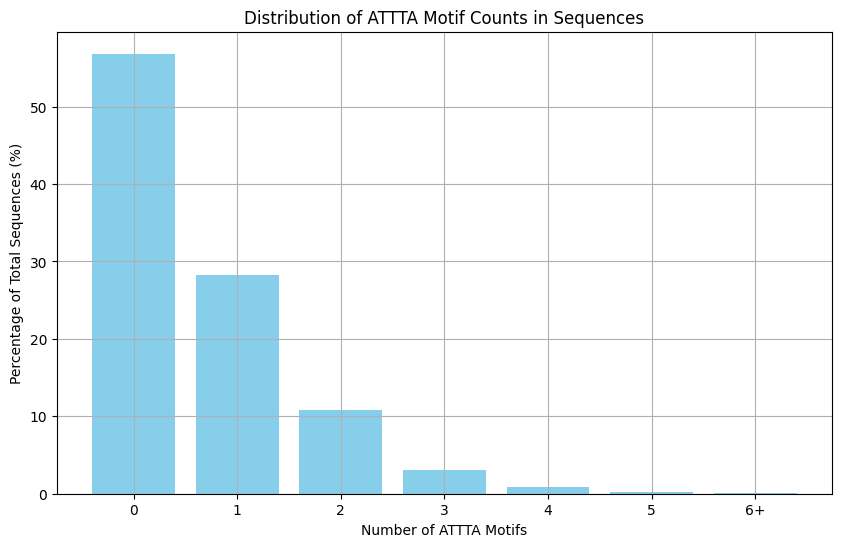

In [48]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'sequences' is a list of DNA sequences and is defined earlier
motif = 'ATTTA'
motif_counts = [seq.count(motif) for seq in sequences]

# Create a DataFrame from motif counts
counts_df = pd.DataFrame(motif_counts, columns=['Motif Counts'])

# Define bin edges from 0 to 6 (inclusive)
bin_edges = list(range(8))  # This creates an array [0, 1, 2, 3, 4, 5, 6, 7] to include 6 completely

# Bin the count values
counts_df['Binned Counts'] = pd.cut(counts_df['Motif Counts'], bins=bin_edges, right=False, labels=['0', '1', '2', '3', '4', '5', '6+'])

# Calculate the counts for each bin
bin_counts = counts_df['Binned Counts'].value_counts().sort_index()

# Calculate the percentage of the total for each bin
total_sequences = len(sequences)
bin_percentages = (bin_counts / total_sequences) * 100

# Plotting the vertical bar plot with percentages on y-axis
plt.figure(figsize=(10, 6))
bar_width = 0.8  # Fixed bar width
plt.bar(bin_counts.index, bin_percentages.values, color='skyblue', width=bar_width)
plt.ylabel('Percentage of Total Sequences (%)')
plt.xlabel('Number of ATTTA Motifs')
plt.title('Distribution of ATTTA Motif Counts in Sequences')
plt.xticks(range(len(bin_counts.index)), labels=bin_counts.index)
plt.grid(True)
plt.show()


# AAAAAA or AATAAA motif frequency

In [1]:
from Bio import SeqIO
import matplotlib.pyplot as plt
import re

In [2]:
import re

def count_motifs(sequence):
    # This pattern will find non-overlapping occurrences of either "AAAAAA" or "AATAAA"
    return len(re.findall(r'AAAAAA|AATAAA', str(sequence)))


In [3]:
def get_motif_counts(filepath):
    motif_counts = []
    for record in SeqIO.parse(filepath, "fasta"):
        count = count_motifs(record.seq)
        motif_counts.append(count)
    return motif_counts

# Specify the path to your FASTA file
filepath = '/home/yg2895/media/scratch/yang/haploinsufficiency/haplo-utr3-oligo-pool.fa'
motif_counts = get_motif_counts(filepath)


In [4]:
# calculate percentage

total_sequences = 12000  # Total number of sequences, as specified
motif_present = sum(1 for count in motif_counts if count > 0)
motif_percentage = (motif_present / total_sequences) * 100


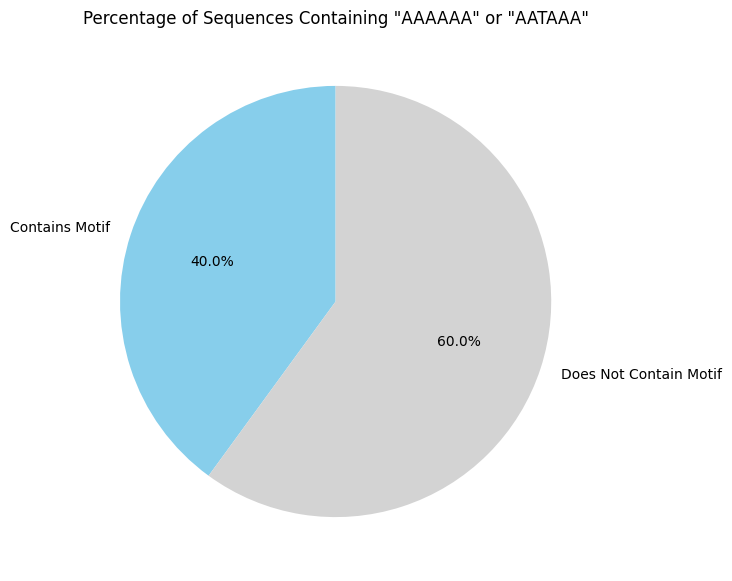

In [5]:
# Data for plotting
labels = ['Contains Motif', 'Does Not Contain Motif']
sizes = [motif_percentage, 100 - motif_percentage]  # percentages

# Pie chart
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgrey'])
plt.title('Percentage of Sequences Containing "AAAAAA" or "AATAAA"')
plt.show()


In [12]:
# change oligo-pool fasta file into csv file

from Bio import SeqIO
import pandas as pd

# Path to your FASTA file
fasta_file = '../haplo-utr3-oligo-pool.fa'

# CSV file path to save the results
csv_file = 'haplo-utr3-oligo-pool.csv'

# Reading the FASTA file
sequences = []
for record in SeqIO.parse(fasta_file, 'fasta'):
    # Append a tuple of (ID, sequence)
    sequences.append((record.id, str(record.seq)))

# Create a DataFrame
df = pd.DataFrame(sequences, columns=['Name', 'Sequence'])
df['Name'] = df['Name'].str.replace(',,,','',regex=True)
df['Sequence'] = df['Sequence'].str.replace(',,,','',regex=True)

# Save the DataFrame to a CSV file
df.to_csv(csv_file, index=False)


# Find the correlation with the value and most frequency motif

In [1]:
import pandas as pd

df1 = pd.read_csv('../counts_norm.csv')

In [3]:

df2 = pd.read_csv('haplo-utr3-oligo-pool.csv')
merged_df = pd.merge(df1, df2, on='Name', how='inner')
merged_df.head()

,Seq,Name,hek-gDNA1,hek-gDNA2,hek-gDNA3,hek-RNA1,hek-RNA2,hek-RNA3,sk-gDNA1,sk-gDNA2,sk-gDNA3,sk-RNA1,sk-RNA2,sk-RNA3,aso-lib1,aso-lib2,Sequence
0,ATTATTCATACTAGGGTTTGACCAACAAAG,AAGAB|ENST00000261880.10|1,77.222429,73.641523,97.547469,61.577962,61.805634,71.065166,75.686370,65.481679,32.531802,40.149893,41.055298,47.957851,62.379810,60.856045,GTTCAGCGTCGACCAATTATTCATACTAGGGTTTGACCAACAAAGA...
1,TTAGTTTTTAGTAGGAGGTTAAGGAGAAAT,AAGAB|ENST00000261880.10|2,57.989275,55.429103,84.554264,61.632335,64.804522,81.768808,79.967217,76.168337,33.321649,45.737016,46.935013,40.231831,69.823800,66.029386,GTTCAGCGTCGACCATTAGTTTTTAGTAGGAGGTTAAGGAGAAATC...
2,TAAATCTCAGAGGTCTGTGTGATTTACTCA,AAGAB|ENST00000261880.10|3,129.705226,133.587072,147.846920,178.345002,184.902808,189.799558,170.412553,176.285443,149.305668,84.411521,83.959240,86.564391,163.580654,158.225718,GTTCAGCGTCGACCATAAATCTCAGAGGTCTGTGTGATTTACTCAA...
3,ATTTGGGTTTTCTCCATTCAAGGAGCTTGT,AAGAB|ENST00000261880.10|4,49.268489,47.276039,62.185281,48.854568,56.122029,65.391650,54.107914,50.798626,29.643926,36.280023,33.378291,27.559276,42.439064,42.079588,GTTCAGCGTCGACCAATTTGGGTTTTCTCCATTCAAGGAGCTTGTA...
4,GAAAATGCCTCTGGGCATTCTTTTGAAGTA,AAGAB|ENST00000261880.10|5,85.943215,82.938362,99.245444,79.113408,91.451775,96.186555,84.720948,74.865808,51.364704,60.249026,58.540388,52.456843,64.667069,62.588191,GTTCAGCGTCGACCAGAAAATGCCTCTGGGCATTCTTTTGAAGTAT...


In [4]:
merged_df['hek_rd'] = merged_df.iloc[:,5:8].mean(axis=1)/merged_df.iloc[:,2:5].mean(axis=1)
merged_df['sk_rd'] = merged_df.iloc[:,11:14].mean(axis=1)/merged_df.iloc[:,8:11].mean(axis=1)

In [5]:
# extract only several columns
columns_to_extract = ['Sequence', 'hek_rd','sk_rd']

# Extract the specified columns
selected_columns = merged_df[columns_to_extract]

# Display the extracted DataFrame
print(selected_columns)

                                                Sequence    hek_rd     sk_rd
0      GTTCAGCGTCGACCAATTATTCATACTAGGGTTTGACCAACAAAGA...  0.782769  0.743599
1      GTTCAGCGTCGACCATTAGTTTTTAGTAGGAGGTTAAGGAGAAATC...  1.051689  0.701498
2      GTTCAGCGTCGACCATAAATCTCAGAGGTCTGTGTGATTTACTCAA...  1.345158  0.513978
3      GTTCAGCGTCGACCAATTTGGGTTTTCTCCATTCAAGGAGCTTGTA...  1.073322  0.722536
4      GTTCAGCGTCGACCAGAAAATGCCTCTGGGCATTCTTTTGAAGTAT...  0.994871  0.811780
...                                                  ...       ...       ...
10225  GTTCAGCGTCGACCAGCTTGTGCAGTGTCCCCTCCCTCGGACCAAA...  0.130659  0.041918
10226  GTTCAGCGTCGACCAGCTTAAATGCTGTCCCCTCCCTCGGACCAAA...  0.154718  0.070772
10227  GTTCAGCGTCGACCAGCTTCCGATTTGTCCCCTCCCTCGGACCAAA...  0.170820  0.066221
10228  GTTCAGCGTCGACCAGCTTGTTCGATGTCCCCTCCCTCGGACCAAA...  0.266087  0.222978
10229  GTTCAGCGTCGACCAGCTTTGCGCGTGTCCCCTCCCTCGGACCAAA...  0.148934  0.069785

[10230 rows x 3 columns]


In [6]:
selected_columns.to_csv('oligo_ratio.csv', index=False)

# The correlation between RNA/DNA ratio and ATTTA, AAAAAA, AATAAA motif

In [7]:
# Load data 
df = pd.read_csv('oligo_ratio.csv')


# Define motifs
motifs = ['ATTTA', 'AAAAAA', 'AATAAA']

# Count occurrences of each motif in the sequences
for motif in motifs:
    df[f'{motif}_count'] = df['Sequence'].apply(lambda x: x.count(motif))

print(df.head())

                                            Sequence    hek_rd     sk_rd  \
0  GTTCAGCGTCGACCAATTATTCATACTAGGGTTTGACCAACAAAGA...  0.782769  0.743599   
1  GTTCAGCGTCGACCATTAGTTTTTAGTAGGAGGTTAAGGAGAAATC...  1.051689  0.701498   
2  GTTCAGCGTCGACCATAAATCTCAGAGGTCTGTGTGATTTACTCAA...  1.345158  0.513978   
3  GTTCAGCGTCGACCAATTTGGGTTTTCTCCATTCAAGGAGCTTGTA...  1.073322  0.722536   
4  GTTCAGCGTCGACCAGAAAATGCCTCTGGGCATTCTTTTGAAGTAT...  0.994871  0.811780   

   ATTTA_count  AAAAAA_count  AATAAA_count  
0            0             0             0  
1            1             0             0  
2            1             0             0  
3            0             0             1  
4            0             0             1  


In [8]:
# correlation
df1 = df.iloc[:,[1,2,3,4,5]]
print(df1.head())

corr = df1.corr(method="pearson")
corr

     hek_rd     sk_rd  ATTTA_count  AAAAAA_count  AATAAA_count
0  0.782769  0.743599            0             0             0
1  1.051689  0.701498            1             0             0
2  1.345158  0.513978            1             0             0
3  1.073322  0.722536            0             0             1
4  0.994871  0.811780            0             0             1


,hek_rd,sk_rd,ATTTA_count,AAAAAA_count,AATAAA_count
hek_rd,1.000000,0.425947,-0.254342,-0.168930,-0.278091
sk_rd,0.425947,1.000000,-0.034174,-0.067105,-0.148204
ATTTA_count,-0.254342,-0.034174,1.000000,0.049186,0.033659
AAAAAA_count,-0.168930,-0.067105,0.049186,1.000000,0.046906
AATAAA_count,-0.278091,-0.148204,0.033659,0.046906,1.000000


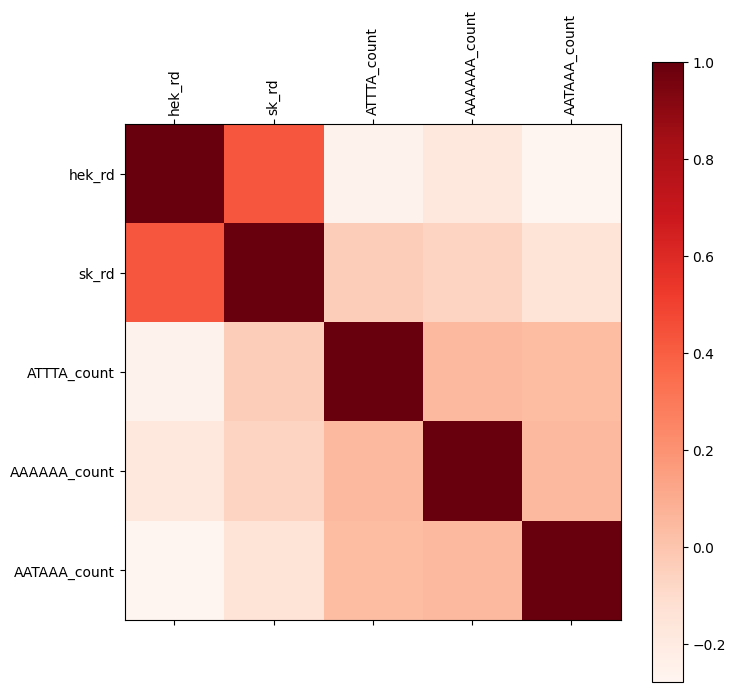

In [17]:
# draw plot
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))
plt.matshow(corr, cmap='Reds', fignum=fig.number)
plt.xticks(range(len(corr.columns)), corr.columns, rotation='vertical');
plt.yticks(range(len(corr.columns)), corr.columns);
plt.colorbar()

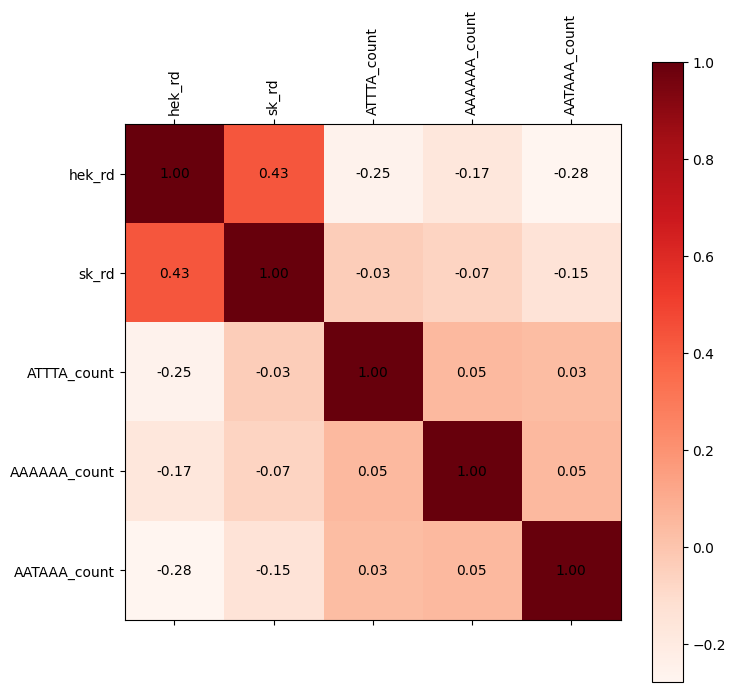

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'corr' is a Pandas DataFrame containing the correlation matrix
fig = plt.figure(figsize=(8, 8))
plt.matshow(corr, cmap='Reds', fignum=fig.number)

# Add ticks
plt.xticks(range(len(corr.columns)), corr.columns, rotation='vertical')
plt.yticks(range(len(corr.columns)), corr.columns)

# Add a colorbar
plt.colorbar()

# Annotate the heatmap with correlation values
for (i, j), val in np.ndenumerate(corr):
    plt.text(j, i, f"{val:.2f}", ha='center', va='center', color='black')

# Display the plot
plt.show()


In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load data 
df = pd.read_csv('oligo_ratio.csv')

# normalize the data by using log
df.iloc[:,[1,2]] = np.log2(df.iloc[:,[1,2]])
#print(df.head())

# Define motifs
motifs = ['ATTTA', 'AAAAAA', 'AATAAA']

# only scan the sequence from 16-285bp
df['Adjusted Sequence'] = df['Sequence'].apply(lambda x: x[15:285])

# Count occurrences of each motif in the sequences
for motif in motifs:
    df[f'{motif}_count'] = df['Adjusted Sequence'].apply(lambda x: x.count(motif))

print(df.head())

                                            Sequence    hek_rd     sk_rd  \
0  GTTCAGCGTCGACCAATTATTCATACTAGGGTTTGACCAACAAAGA... -0.353341 -0.427403   
1  GTTCAGCGTCGACCATTAGTTTTTAGTAGGAGGTTAAGGAGAAATC...  0.072708 -0.511489   
2  GTTCAGCGTCGACCATAAATCTCAGAGGTCTGTGTGATTTACTCAA...  0.427776 -0.960220   
3  GTTCAGCGTCGACCAATTTGGGTTTTCTCCATTCAAGGAGCTTGTA...  0.102083 -0.468858   
4  GTTCAGCGTCGACCAGAAAATGCCTCTGGGCATTCTTTTGAAGTAT... -0.007419 -0.300839   

                                   Adjusted Sequence  ATTTA_count  \
0  ATTATTCATACTAGGGTTTGACCAACAAAGATGCTAGCTGTCTCTG...            0   
1  TTAGTTTTTAGTAGGAGGTTAAGGAGAAATCTTTTTTTTCCTCAGT...            1   
2  TAAATCTCAGAGGTCTGTGTGATTTACTCAAGTTGAAGACAACCTC...            1   
3  ATTTGGGTTTTCTCCATTCAAGGAGCTTGTAGCTCTGAGCTATGAT...            0   
4  GAAAATGCCTCTGGGCATTCTTTTGAAGTATAGTGTCTGAGCTCAT...            0   

   AAAAAA_count  AATAAA_count  
0             0             0  
1             0             0  
2             0             0  


In [20]:
# df.to_csv('motif_count.csv',index="False")
len(df[df["ATTTA_count"] == 6])


2

In [21]:
# define a function to count the occurrence of the motif
def count_motif(sequence, motif):
    return sequence.count(motif)

/tmp/ipykernel_1864289/2504826452.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='ATTTA_count', y='hek_rd', data=filtered_df, ax=ax[0], palette='Set3')
/tmp/ipykernel_1864289/2504826452.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='AAAAAA_count', y='hek_rd', data=filtered_df, ax=ax[1], palette='Set2')
/tmp/ipykernel_1864289/2504826452.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='AATAAA_count', y='hek_rd', data=filtered_df, ax=ax[2], palette='Set1')


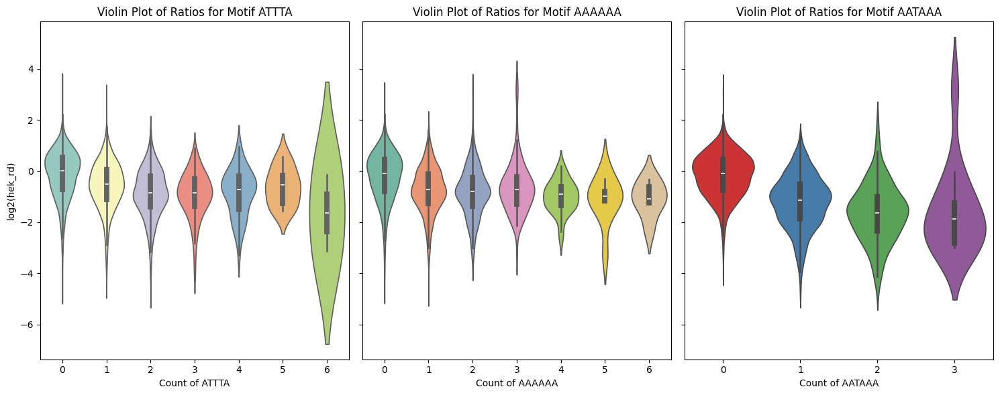

In [22]:
# Filter the rows where AATAAA_count is less than 4
filtered_df = df[(df['AATAAA_count'] < 4) & (df['AAAAAA_count'] <= 6)]


# Separate plots for each motif
fig, ax = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Plot for ATTTA
sns.violinplot(x='ATTTA_count', y='hek_rd', data=filtered_df, ax=ax[0], palette='Set3')
ax[0].set_title('Violin Plot of Ratios for Motif ATTTA')
ax[0].set_xlabel('Count of ATTTA')
ax[0].set_ylabel('log2(hek_rd)')

# Plot for AAAAAA
sns.violinplot(x='AAAAAA_count', y='hek_rd', data=filtered_df, ax=ax[1], palette='Set2')
ax[1].set_title('Violin Plot of Ratios for Motif AAAAAA')
ax[1].set_xlabel('Count of AAAAAA')
ax[1].set_ylabel('log2(hek_rd)')

# Plot for AATAAA
sns.violinplot(x='AATAAA_count', y='hek_rd', data=filtered_df, ax=ax[2], palette='Set1')
ax[2].set_title('Violin Plot of Ratios for Motif AATAAA')
ax[2].set_xlabel('Count of AATAAA')
ax[2].set_ylabel('log2(hek_rd)')

# Adjust layout
plt.tight_layout()
plt.show()

/tmp/ipykernel_1864289/1671238437.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='ATTTA_count', y='sk_rd', data=filtered_df, ax=ax[0], palette='Set3')
/tmp/ipykernel_1864289/1671238437.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='AAAAAA_count', y='sk_rd', data=filtered_df, ax=ax[1], palette='Set2')
/tmp/ipykernel_1864289/1671238437.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='AATAAA_count', y='sk_rd', data=filtered_df, ax=ax[2], palette='Set1')


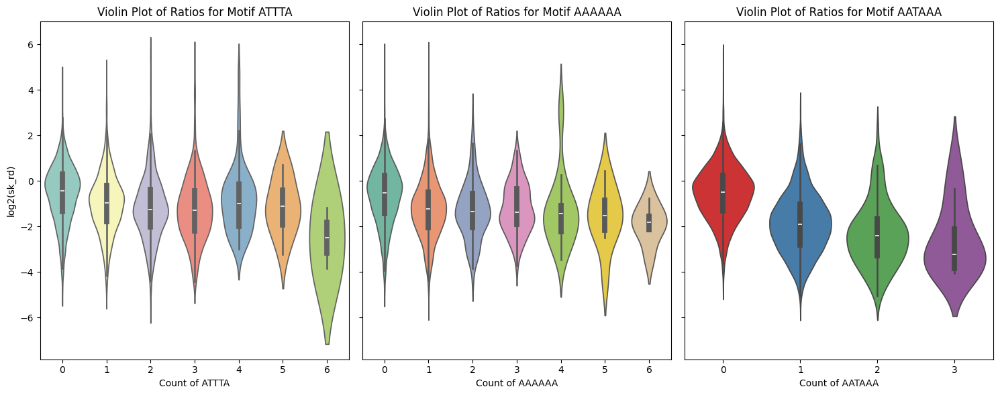

In [23]:
# based on sk_rd 

filtered_df = df[(df['AATAAA_count'] < 4) & (df['AAAAAA_count'] <= 6)]

# Separate plots for each motif
fig, ax = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Plot for ATTTA
sns.violinplot(x='ATTTA_count', y='sk_rd', data=filtered_df, ax=ax[0], palette='Set3')
ax[0].set_title('Violin Plot of Ratios for Motif ATTTA')
ax[0].set_xlabel('Count of ATTTA')
ax[0].set_ylabel('log2(sk_rd)')

# Plot for AAAAAA
sns.violinplot(x='AAAAAA_count', y='sk_rd', data=filtered_df, ax=ax[1], palette='Set2')
ax[1].set_title('Violin Plot of Ratios for Motif AAAAAA')
ax[1].set_xlabel('Count of AAAAAA')
ax[1].set_ylabel('log2(sk_rd)')

# Plot for AATAAA
sns.violinplot(x='AATAAA_count', y='sk_rd', data=filtered_df, ax=ax[2], palette='Set1')
ax[2].set_title('Violin Plot of Ratios for Motif AATAAA')
ax[2].set_xlabel('Count of AATAAA')
ax[2].set_ylabel('log2(sk_rd)')

# Adjust layout
plt.tight_layout()
plt.show()

/tmp/ipykernel_3143830/655953155.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='ATTTA_count', y='hek_rd', data=df, palette='Set3')
/tmp/ipykernel_3143830/655953155.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='AAAAAA_count', y='hek_rd', data=df, palette='Set2')
/tmp/ipykernel_3143830/655953155.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='AATAAA_count', y='hek_rd', data=df, palette='Set1')


Text(0, 0.5, 'HEK293T RNA/DNA Ratio')

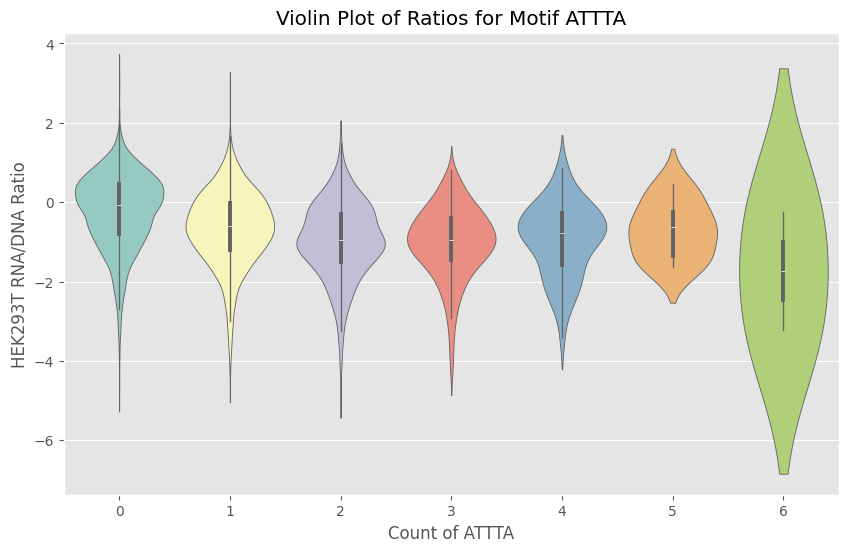

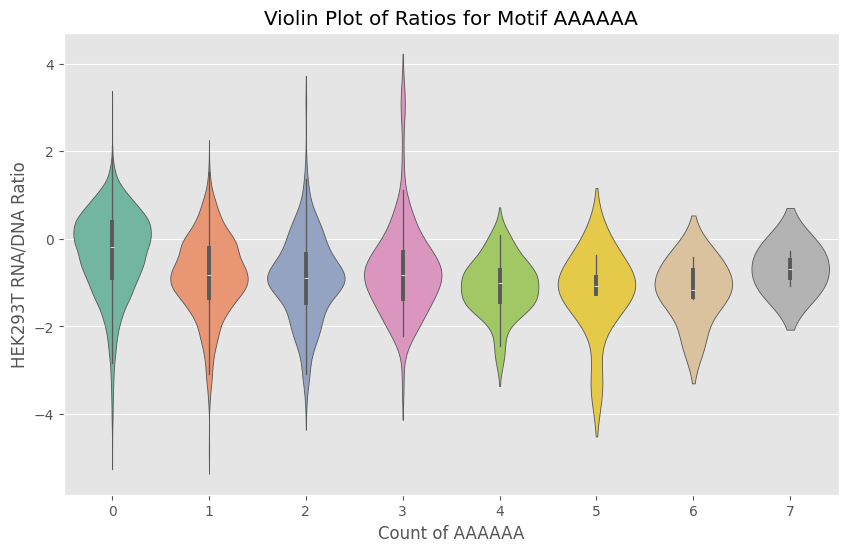

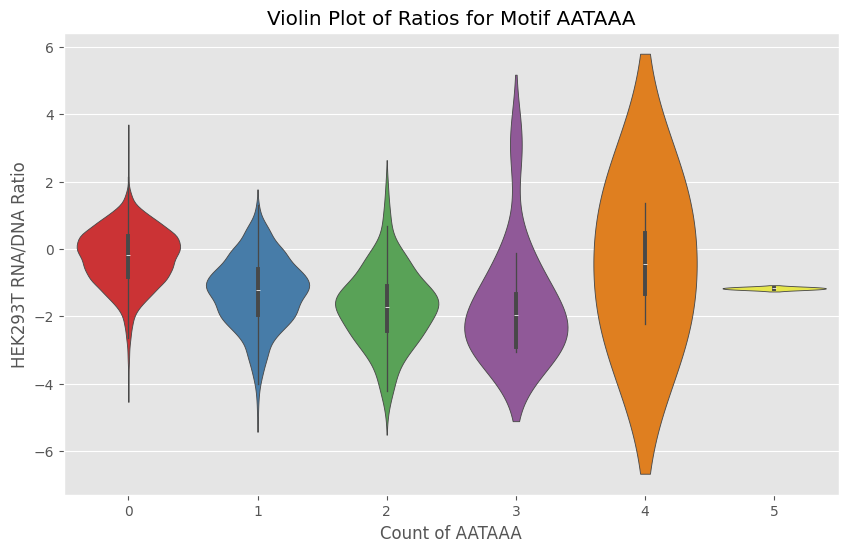

In [85]:
# Seperate the 3 plot

# Create a violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='ATTTA_count', y='hek_rd', data=df, palette='Set3')
plt.title('Violin Plot of Ratios for Motif ATTTA')
plt.xlabel('Count of ATTTA')
plt.ylabel('HEK293T RNA/DNA Ratio')

plt.figure(figsize=(10, 6))
sns.violinplot(x='AAAAAA_count', y='hek_rd', data=df, palette='Set2')
plt.title('Violin Plot of Ratios for Motif AAAAAA')
plt.xlabel('Count of AAAAAA')
plt.ylabel('HEK293T RNA/DNA Ratio')

plt.figure(figsize=(10, 6))
sns.violinplot(x='AATAAA_count', y='hek_rd', data=df, palette='Set1')
plt.title('Violin Plot of Ratios for Motif AATAAA')
plt.xlabel('Count of AATAAA')
plt.ylabel('HEK293T RNA/DNA Ratio')

# Most frequency motif based on ratio

In [24]:
import pandas as pd
import numpy as np
from collections import Counter
from itertools import product

# Load data 
df = pd.read_csv('oligo_ratio.csv')

# Replace inf with NaN
df = df.replace([np.inf, -np.inf], np.nan)

# Generate all possible 5-nt motifs
bases = ['A', 'T', 'C', 'G']
motifs = [''.join(p) for p in product(bases, repeat=5)]

# Function to count a motif in a sequence
def count_motif(sequence, motif):
    return sequence.count(motif)

# Adjust sequences to consider only the 16th to 185th nucleotides
# Python uses 0-based indexing, so we need positions 15 to 185
df['Adjusted Sequence'] = df['Sequence'].apply(lambda x: x[15:285])

len(df['Adjusted Sequence'][1])


270

In [25]:
from scipy.stats import ttest_ind

summary = []

for motif in motifs:
        # count occurrences of each motif in each sequence
        df[motif] = df['Adjusted Sequence'].apply(lambda x: count_motif(x, motif))

        # Determine sequences with and without motif
        with_motif = df[df[motif] >0]
        without_motif = df[df[motif] == 0]

        # calculate ts mean value
        mean_with_motif = with_motif['sk_rd'].mean() if not with_motif.empty else np.nan
        mean_without_motif = without_motif['sk_rd'].mean() if not without_motif.empty else np.nan
        
        # t-test to analyze with_motif and without_motif, change Inf into nan, tsn omit nan
        with_motif['sk_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
        without_motif['sk_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
        
        t_stat, p_value = ttest_ind(with_motif['sk_rd'], without_motif['sk_rd'],equal_var=False, nan_policy='omit')

        summary.append({
            'Motif': motif,
            'Count_With_Motif': len(with_motif),
            'Count_Without_Motif': len(without_motif),
            'Mean_Value_With_Motif': mean_with_motif,
            'Mean_Value_Without_Motif': mean_without_motif,
            'Pvalue': p_value
    
        })

/tmp/ipykernel_1864289/3278405425.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  with_motif['sk_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
/tmp/ipykernel_1864289/3278405425.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  with_motif['sk_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
/tmp/ipykernel_1864289/3278405425

In [26]:
# Convert the summary list to a df
summary_df = pd.DataFrame(summary)
print(summary_df.head(), len(summary_df))

   Motif  Count_With_Motif  Count_Without_Motif  Mean_Value_With_Motif  \
0  AAAAA              4670                 5560               0.739135   
1  AAAAT              5341                 4889               0.742826   
2  AAAAC              3721                 6509               0.746127   
3  AAAAG              4470                 5760               0.771672   
4  AAATA              4544                 5686               0.696203   

   Mean_Value_Without_Motif        Pvalue  
0                  1.016514  2.520595e-24  
1                  1.050551  4.395724e-32  
2                  0.972076  4.515025e-17  
3                  0.981633  1.656023e-14  
4                  1.044677  2.504765e-38   1024


In [27]:
summary_df['ratio'] = summary_df['Mean_Value_With_Motif']/summary_df['Mean_Value_Without_Motif']
sorted_df = summary_df.sort_values(by='ratio', ascending=False)
sorted_df.to_csv('motif_ratio_sk.csv', index=False)

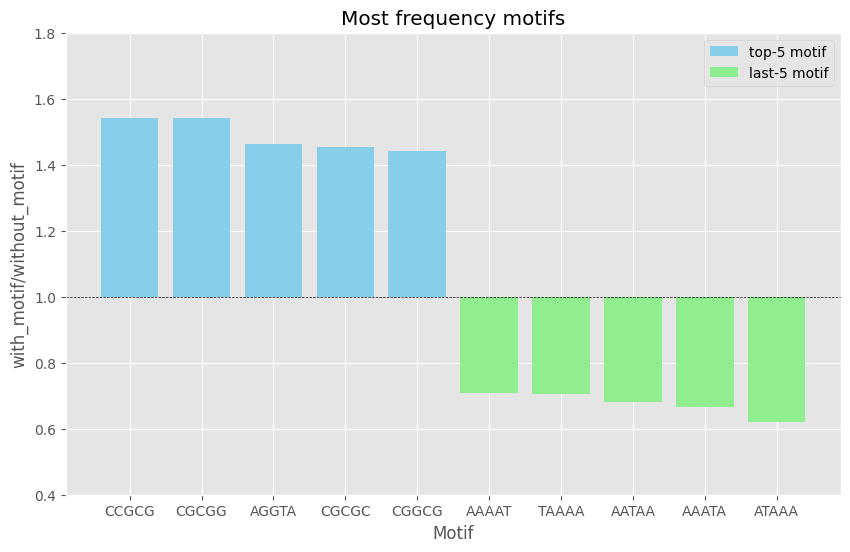

In [28]:
# using the top 5 and tail 5 most frequenct motif to draw a bar plot using ratio

import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('motif_ratio_sk.csv')

top_5 = df.loc[:4, ['Motif','ratio']]
tail_5 = df.loc[df.shape[0]-5:, ['Motif', 'ratio']]

select_df = pd.concat([top_5, tail_5])

# create x-axis labels
motif_labels = select_df['Motif']
select_df.index = motif_labels

# draw bar plot
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(10, 6))

# Define the colors for the two groups
colors = ['skyblue', 'lightgreen']

# Plot the first 5 rows
ax.bar(top_5['Motif'], top_5['ratio'] - 1, bottom=1, color=colors[0], label='top-5 motif')

# Plot the last 5 rows
ax.bar(tail_5['Motif'], tail_5['ratio'] - 1, bottom=1, color=colors[1], label='last-5 motif')

# Adding titles and labels
plt.title('Most frequency motifs')
plt.xlabel('Motif')
plt.ylabel('with_motif/without_motif')

# Draw a horizontal line at y=1
plt.axhline(1, color='black', linewidth=0.5, linestyle='--')

# Legend
plt.legend()

# Adjust the y-axis to better show the plot based on your data's range
plt.ylim(0.4, 1.8)

# Show the plot
plt.show()

In [92]:
import pandas as pd
import numpy as np
from collections import Counter
from itertools import product

# Load data 
df = pd.read_csv('oligo_ratio.csv')

# Replace inf with NaN
df = df.replace([np.inf, -np.inf], np.nan)

# Generate all possible 5-nt motifs
bases = ['A', 'T', 'C', 'G']
motifs = [''.join(p) for p in product(bases, repeat=6)]

# Function to count a motif in a sequence
def count_motif(sequence, motif):
    return sequence.count(motif)

# Adjust sequences to consider only the 16th to 185th nucleotides
# Python uses 0-based indexing, so we need positions 15 to 185
df['Adjusted Sequence'] = df['Sequence'].apply(lambda x: x[15:285])

len(df['Adjusted Sequence'][1])

270

In [93]:
from scipy.stats import ttest_ind

summary = []

for motif in motifs:
        # count occurrences of each motif in each sequence
        df[motif] = df['Adjusted Sequence'].apply(lambda x: count_motif(x, motif))

        # Determine sequences with and without motif
        with_motif = df[df[motif] >0]
        without_motif = df[df[motif] == 0]

        # calculate the mean value
        mean_with_motif = with_motif['hek_rd'].mean() if not with_motif.empty else np.nan
        mean_without_motif = without_motif['hek_rd'].mean() if not without_motif.empty else np.nan
        
        # t-test to analyze with_motif and without_motif, change Inf into nan, then omit nan
        with_motif['hek_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
        without_motif['hek_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
        
        t_stat, p_value = ttest_ind(with_motif['hek_rd'], without_motif['hek_rd'],equal_var=False, nan_policy='omit')

        summary.append({
            'Motif': motif,
            'Count_With_Motif': len(with_motif),
            'Count_Without_Motif': len(without_motif),
            'Mean_Value_With_Motif': mean_with_motif,
            'Mean_Value_Without_Motif': mean_without_motif,
            'Pvalue': p_value
    
        })

/tmp/ipykernel_3143830/1881782580.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  with_motif['hek_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
/tmp/ipykernel_3143830/1881782580.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  with_motif['hek_rd'].replace([np.inf, -np.inf], np.nan, inplace=True)
/tmp/ipykernel_3143830/18817825

In [5]:
# Convert the summary list to a df
summary_df = pd.DataFrame(summary)
print(summary_df.head(), len(summary_df))

    Motif  Count_With_Motif  Count_Without_Motif  Mean_Value_With_Motif  \
0  AAAAAA              2930                 9070               0.437034   
1  AAAAAT              3556                 8444               0.463713   
2  AAAAAC              1771                10229               0.502195   
3  AAAAAG              2571                 9429               0.485225   
4  AAAATA              3190                 8810               0.452316   

   Mean_Value_Without_Motif         Pvalue  
0                  0.756356  2.573259e-138  
1                  0.768451  6.132528e-143  
2                  0.709406   5.628102e-45  
3                  0.731508  1.300340e-108  
4                  0.760023  1.981428e-133   4096


In [11]:
summary_df['ratio'] = summary_df['Mean_Value_With_Motif']/summary_df['Mean_Value_Without_Motif']
sorted_df = summary_df.sort_values(by='Count_With_Motif', ascending=False)
sorted_df.to_csv('motif_ratio_hek.csv', index=False)
print(sorted_df.head())

       Motif  Count_With_Motif  Count_Without_Motif  Mean_Value_With_Motif  \
341   ATTTTT              4195                 7805               0.463071   
1360  TTTTAA              4107                 7893               0.467695   
1364  TTTTTA              4022                 7978               0.469405   
1344  TTTAAA              3997                 8003               0.451102   
1365  TTTTTT              3934                 8066               0.456487   

      Mean_Value_Without_Motif         Pvalue     ratio  
341                   0.794812  1.109819e-232  0.582617  
1360                  0.788573  1.502187e-216  0.593090  
1364                  0.784318  6.922390e-206  0.598487  
1344                  0.791948  2.494529e-253  0.569611  
1365                  0.787356  1.872395e-234  0.579772  


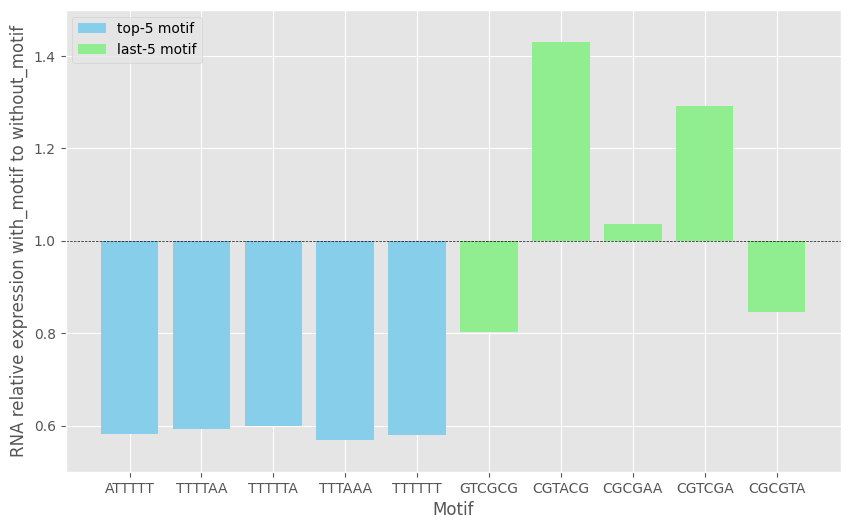

In [13]:
# using the top 5 and tail 5 most frequenct motif to draw a bar plot using ratio

import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('motif_ratio_sk.csv')

top_5 = df.loc[:4, ['Motif','ratio']]
tail_5 = df.loc[df.shape[0]-7:, ['Motif', 'ratio']]

select_df = pd.concat([top_5, tail_5])

# create x-axis labels
motif_labels = select_df['Motif']
select_df.index = motif_labels

# draw bar plot
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(10, 6))

# Define the colors for the two groups
colors = ['skyblue', 'lightgreen']

# Plot the first 5 rows
ax.bar(top_5['Motif'], top_5['ratio'] - 1, bottom=1, color=colors[0], label='top-5 motif')

# Plot the last 5 rows
ax.bar(tail_5['Motif'], tail_5['ratio'] - 1, bottom=1, color=colors[1], label='last-5 motif')

# Adding titles and labels

plt.xlabel('Motif')
plt.ylabel('RNA relative expression with_motif to without_motif')

# Draw a horizontal line at y=1
plt.axhline(1, color='black', linewidth=0.5, linestyle='--')

# Legend
plt.legend()

# Adjust the y-axis to better show the plot based on your data's range
plt.ylim(0.5,1.5)

# Show the plot
plt.show()